In [124]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Flatten, Concatenate, BatchNormalization, Dropout, LSTM, SpatialDropout1D
from tensorflow.keras.models import Model
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import KFold, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.utils import resample
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Attention, GlobalAveragePooling1D

# import wandb
df = pd.read_pickle('/Users/athenasaghi/VSProjects/CognitiveFatigueDetection/processed_data_full.pkl')

X_raweeg = np.stack(df['raweeg'].values)
X_features = np.stack(df['features'].values)
Y_labels = df['label'].values

# Remove class 3
mask = Y_labels != 3
X_raweeg = X_raweeg[mask]
X_features = X_features[mask]
Y_labels = Y_labels[mask]

num_classes = len(np.unique(Y_labels))
Y_labels = to_categorical(Y_labels, num_classes=num_classes)

scaler = StandardScaler()
X_raweeg = scaler.fit_transform(X_raweeg.reshape(-1, X_raweeg.shape[-1])).reshape(X_raweeg.shape)
X_features = scaler.fit_transform(X_features.reshape(-1, X_features.shape[-1])).reshape(X_features.shape)

# Replace padding zeros with small noise to avoid learning issues
X_raweeg[X_raweeg == 0] = np.random.normal(loc=0, scale=1e-6, size=np.sum(X_raweeg == 0))

# Oversample minority classes
X_resampled, Y_resampled, Xf_resampled = [], [], []
labels = np.argmax(Y_labels, axis=1)
for cls in np.unique(labels):
    cls_indices = np.where(labels == cls)[0]
    X_cls_raweeg = X_raweeg[cls_indices]
    X_cls_features = X_features[cls_indices]
    Y_cls = Y_labels[cls_indices]
    X_cls_raweeg, Y_cls, X_cls_features = resample(X_cls_raweeg, Y_cls, X_cls_features, n_samples=max([len(np.where(labels == c)[0]) for c in np.unique(labels)]), random_state=42)
    X_resampled.append(X_cls_raweeg)
    Y_resampled.append(Y_cls)
    Xf_resampled.append(X_cls_features)

X_raweeg = np.vstack(X_resampled)
Y_labels = np.vstack(Y_resampled)
X_features = np.vstack(Xf_resampled)

# Split into train and test sets
X_train_raweeg, X_test_raweeg, X_train_features, X_test_features, Y_train, Y_test = train_test_split(
    X_raweeg, X_features, Y_labels, test_size=0.2, random_state=42, stratify=np.argmax(Y_labels, axis=1)
)


In [3]:
def get_memory_usage():
    process = psutil.Process(os.getpid())
    return process.memory_info().rss / (1024 * 1024)  

In [125]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dropout, Dense, BatchNormalization
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import AdamW
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.optimizers.schedules import ExponentialDecay
import psutil
import time,os
from tensorflow.keras.layers import Conv1D, MaxPooling1D, GlobalAveragePooling1D

# Set aside a test set before any training

# print("Max raw EEG:", np.max(X_train_raweeg))
# print("Min raw EEG:", np.min(X_train_raweeg))
# print("Max features:", np.max(X_train_features))
# print("Min features:", np.min(X_train_features))

scaler_raweeg = MinMaxScaler()
scaler_features = MinMaxScaler()

X_train_raweeg = scaler_raweeg.fit_transform(X_train_raweeg.reshape(-1, X_train_raweeg.shape[-1])).reshape(X_train_raweeg.shape)
X_test_raweeg = scaler_raweeg.transform(X_test_raweeg.reshape(-1, X_test_raweeg.shape[-1])).reshape(X_test_raweeg.shape)

X_train_features = scaler_features.fit_transform(X_train_features.reshape(-1, X_train_features.shape[-1])).reshape(X_train_features.shape)
X_test_features = scaler_features.transform(X_test_features.reshape(-1, X_test_features.shape[-1])).reshape(X_test_features.shape)

print(X_train_raweeg.shape, X_train_features.shape, Y_train.shape)
print(X_test_raweeg.shape, X_test_features.shape, Y_test.shape)

def add_noise(data, noise_level=0.05):
    return data + noise_level * np.random.randn(*data.shape)

# X_train_raweeg = add_noise(X_train_raweeg, noise_level=0.005)
# X_train_features = add_noise(X_train_features, noise_level=0.01)
# Encoder function with L2 normalization before output

def create_cnn_encoder(input_shape):
    inputs = Input(shape=input_shape)
    x = Conv1D(16, kernel_size=3, activation='relu')(inputs)
    x = MaxPooling1D(pool_size=2)(x)
    x = Conv1D(32, kernel_size=3, activation='relu')(x)
    x = GlobalAveragePooling1D()(x)
    x = Dense(32, activation=None)(x)
    model = Model(inputs=inputs, outputs=x)
    return model

def create_lstm_encoder(input_shape):
    inputs = Input(shape=input_shape)
    x = LSTM(32, return_sequences=False, kernel_regularizer=l2(1e-4))(inputs)
    x = Dropout(0.5)(x)
    x = Dense(32, activation=None, kernel_regularizer=l2(1e-4))(x)
    model = Model(inputs=inputs, outputs=x)
    return model

encoder_raweeg = create_cnn_encoder(X_train_raweeg.shape[1:])
encoder_features = create_cnn_encoder(X_train_features.shape[1:])

def contrastive_loss(z_raweeg, z_features, temperature=0.2):
    epsilon = 1e-6
    z_raweeg = tf.math.l2_normalize(z_raweeg + epsilon, axis=1)
    z_features = tf.math.l2_normalize(z_features + epsilon, axis=1)
    logits = tf.matmul(z_raweeg, z_features, transpose_b=True) / temperature
    batch_size = tf.shape(logits)[0]
    labels = tf.range(batch_size)
    loss = tf.keras.losses.sparse_categorical_crossentropy(labels, logits, from_logits=True)
    return tf.reduce_mean(loss)

lr_schedule = ExponentialDecay(
    initial_learning_rate=1e-3,
    decay_steps=1000,
    decay_rate=0.96,
    staircase=True
)

optimizer = AdamW(learning_rate=lr_schedule, weight_decay=1e-4, clipnorm=0.6)
epochs = 200
batch_size = 32 

start_time = time.time()
initial_ram = get_memory_usage()
for epoch in range(epochs):
    idx = np.random.permutation(len(X_train_raweeg))
    X_raweeg_shuffled = X_train_raweeg[idx]
    X_features_shuffled = X_train_features[idx]
    losses = []
    
    # print(len(X_train_raweeg) - batch_size + 1, batch_size)
    for i in range(0, len(X_train_raweeg) - batch_size + 1, batch_size):  # Ensure full batches
        x_r_batch = X_raweeg_shuffled[i:i+batch_size]
        x_f_batch = X_features_shuffled[i:i+batch_size]
        with tf.GradientTape() as tape:
            z_r = encoder_raweeg(x_r_batch, training=True)
            z_f = encoder_features(x_f_batch, training=True)
            loss = contrastive_loss(z_r, z_f)

        grads = tape.gradient(loss, encoder_raweeg.trainable_variables + encoder_features.trainable_variables)

        # Check for NaN in gradients
        if any(tf.math.reduce_any(tf.math.is_nan(g)) for g in grads if g is not None):
            print("NaN detected in gradients! Stopping training.")
            break

        optimizer.apply_gradients(zip(grads, encoder_raweeg.trainable_variables + encoder_features.trainable_variables))
        losses.append(loss.numpy())

    print(f"Epoch {epoch+1}/{epochs}, Contrastive Loss: {np.mean(losses):.4f}")

# Check if embeddings are meaningful (should have variance)
z_r_sample = encoder_raweeg.predict(X_train_raweeg[:10])
print("Encoder Output - Mean:", np.mean(z_r_sample), "Std Dev:", np.std(z_r_sample))


(117, 1854, 4) (117, 202, 16) (117, 3)
(30, 1854, 4) (30, 202, 16) (30, 3)
Epoch 1/200, Contrastive Loss: 3.4712
Epoch 2/200, Contrastive Loss: 3.4656
Epoch 3/200, Contrastive Loss: 3.4632
Epoch 4/200, Contrastive Loss: 3.4610
Epoch 5/200, Contrastive Loss: 3.4594
Epoch 6/200, Contrastive Loss: 3.4517
Epoch 7/200, Contrastive Loss: 3.4467
Epoch 8/200, Contrastive Loss: 3.4261
Epoch 9/200, Contrastive Loss: 3.3939
Epoch 10/200, Contrastive Loss: 3.3293
Epoch 11/200, Contrastive Loss: 3.2546
Epoch 12/200, Contrastive Loss: 3.1583
Epoch 13/200, Contrastive Loss: 3.1606
Epoch 14/200, Contrastive Loss: 3.0634
Epoch 15/200, Contrastive Loss: 3.0276
Epoch 16/200, Contrastive Loss: 2.9745
Epoch 17/200, Contrastive Loss: 2.9581
Epoch 18/200, Contrastive Loss: 3.0177
Epoch 19/200, Contrastive Loss: 2.9407
Epoch 20/200, Contrastive Loss: 2.8474
Epoch 21/200, Contrastive Loss: 2.9813
Epoch 22/200, Contrastive Loss: 2.9140
Epoch 23/200, Contrastive Loss: 2.9096
Epoch 24/200, Contrastive Loss: 2.880

In [131]:
from tensorflow.keras.layers import Concatenate
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, confusion_matrix, f1_score
from sklearn.model_selection import StratifiedKFold
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, LSTM, Dropout, Concatenate
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.utils import to_categorical

k = 8
epochs = 450
kf = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)
num_classes = Y_labels.shape[1]

metrics_all = { 'loss': [], 'val_loss': [], 'accuracy': [], 'val_accuracy': [], 'auc': [], 'val_auc': [],
                'precision': [], 'val_precision': [], 'recall': [], 'val_recall': [],
                'f1': [], 'val_f1': [], 'specificity': [], 'val_specificity': [], 'confusion_matrix': []}

metrics_per_class = { f'{metric}_class_{i}': [] for i in range(num_classes)
                      for metric in ['precision', 'recall', 'f1', 'specificity',
                                     'val_precision', 'val_recall', 'val_f1', 'val_specificity','val_acc'] }

true_labels = []
pred_labels = []
misc1 = 0
misc2 = 0
for fold, (train_idx, val_idx) in enumerate(kf.split(X_train_raweeg, np.argmax(Y_train, axis=1))):
    print(f"\n--------------- Fold {fold + 1}/{k}")

    X_train_raweeg_fold, X_val_raweeg_fold = X_train_raweeg[train_idx], X_train_raweeg[val_idx]
    X_train_features_fold, X_val_features_fold = X_train_features[train_idx], X_train_features[val_idx]
    Y_train_fold, Y_val_fold = Y_train[train_idx], Y_train[val_idx]
    
    input_raweeg = Input(shape=(X_train_raweeg.shape[1], X_train_raweeg.shape[2]))
    input_features = Input(shape=(X_train_features.shape[1], X_train_features.shape[2]))
    
    z_raweeg = encoder_raweeg(input_raweeg)
    z_features = encoder_features(input_features)

    combined = Concatenate()([z_raweeg, z_features])
    output = Dense(num_classes, activation='softmax')(combined)

    classifier = Model(inputs=[input_raweeg, input_features], outputs=output)
    classifier.compile(optimizer=AdamW(learning_rate=1e-3, weight_decay=1e-4),
                       loss='categorical_crossentropy',
                       metrics=['accuracy', tf.keras.metrics.AUC(name='auc'),
                                tf.keras.metrics.Precision(name='precision'),
                                tf.keras.metrics.Recall(name='recall'),
                                tf.keras.metrics.SpecificityAtSensitivity(0.5, name='specificity')] +
                                [tf.keras.metrics.Precision(name=f'precision_class_{i}', class_id=i) for i in range(num_classes)] +
                                [tf.keras.metrics.Recall(name=f'recall_class_{i}', class_id=i) for i in range(num_classes)])


    history = classifier.fit([X_train_raweeg_fold, X_train_features_fold], Y_train_fold,
                             validation_data=([X_val_raweeg_fold, X_val_features_fold], Y_val_fold),
                             epochs=epochs, batch_size=128, verbose=1,
                             callbacks=[ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6)])


   

    y_pred = classifier.predict([X_val_raweeg_fold, X_val_features_fold])
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true_classes = np.argmax(Y_val_fold, axis=1)

    t1 = get_memory_usage()
    t2 = time.time()
    for metric in metrics_all.keys():
        # print(metric)
        if metric in history.history:
            metrics_all[metric].append(history.history[metric])
    true_labels.extend(y_true_classes)
    pred_labels.extend(y_pred_classes)

    cm = confusion_matrix(y_true_classes, y_pred_classes)
    cm_dict = {f"row_{i}": row.tolist() for i, row in enumerate(cm)}

    metrics_all['confusion_matrix'] = cm_dict

    for i in range(num_classes):
            metrics_per_class[f'precision_class_{i}'].append(history.history[f'precision_class_{i}'])
           
            metrics_per_class[f'recall_class_{i}'].append(history.history[f'recall_class_{i}'])
            f1_class = f1_score(y_true_classes, y_pred_classes, average=None)[i]
            metrics_per_class[f'f1_class_{i}'].append(f1_class)
            mask = (y_true_classes == i)
            metrics_per_class[f'val_acc_class_{i}'].append(accuracy_score(y_true_classes[mask], y_pred_classes[mask]))
    misc2 = misc2 + time.time()-t2        
    misc1 = misc1+ get_memory_usage() - t1

print("Misc1", misc2, misc1)
total_time = time.time() - start_time - misc2

final_ram_usage = get_memory_usage() - initial_ram - misc1

print("ram usage", final_ram_usage)
print("total time", total_time)


--------------- Fold 1/8
Epoch 1/450
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - accuracy: 0.1176 - auc: 0.2906 - loss: 3.4096 - precision: 0.0920 - precision_class_0: 0.0000e+00 - precision_class_1: 0.1633 - precision_class_2: 0.0000e+00 - recall: 0.0784 - recall_class_0: 0.0000e+00 - recall_class_1: 0.2353 - recall_class_2: 0.0000e+00 - specificity: 0.1618 - val_accuracy: 0.3333 - val_auc: 0.3789 - val_loss: 2.4805 - val_precision: 0.1818 - val_precision_class_0: 0.0000e+00 - val_precision_class_1: 0.2500 - val_precision_class_2: 0.0000e+00 - val_recall: 0.1333 - val_recall_class_0: 0.0000e+00 - val_recall_class_1: 0.4000 - val_recall_class_2: 0.0000e+00 - val_specificity: 0.3000 - learning_rate: 0.0010
Epoch 2/450
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - accuracy: 0.1569 - auc: 0.2979 - loss: 3.0648 - precision: 0.0988 - precision_class_0: 0.0000e+00 - precision_class_1: 0.1860 - precision_class_2: 0.0000e+00 - recall: 0.0784 - recall_class_0: 0.0000e+00 - recall_class_1: 0.2353 - recall

118.28125


In [ ]:
from tensorflow.keras.layers import Concatenate
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, confusion_matrix, f1_score
from sklearn.model_selection import StratifiedKFold
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, LSTM, Dropout, Concatenate
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.utils import to_categorical

k = 8
epochs = 450
kf = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)
num_classes = Y_labels.shape[1]

metrics_all = { 'loss': [], 'val_loss': [], 'accuracy': [], 'val_accuracy': [], 'auc': [], 'val_auc': [],
                'precision': [], 'val_precision': [], 'recall': [], 'val_recall': [],
                'f1': [], 'val_f1': [], 'specificity': [], 'val_specificity': [], 'confusion_matrix': []}

metrics_per_class = { f'{metric}_class_{i}': [] for i in range(num_classes)
                      for metric in ['precision', 'recall', 'f1', 'specificity',
                                     'val_precision', 'val_recall', 'val_f1', 'val_specificity','val_acc'] }

true_labels = []
pred_labels = []
misc1 = 0
misc2 = 0
for fold, (train_idx, val_idx) in enumerate(kf.split(X_train_raweeg, np.argmax(Y_train, axis=1))):
    print(f"\n--------------- Fold {fold + 1}/{k}")

    X_train_raweeg_fold, X_val_raweeg_fold = X_train_raweeg[train_idx], X_train_raweeg[val_idx]
    X_train_features_fold, X_val_features_fold = X_train_features[train_idx], X_train_features[val_idx]
    Y_train_fold, Y_val_fold = Y_train[train_idx], Y_train[val_idx]
    
    input_raweeg = Input(shape=(X_train_raweeg.shape[1], X_train_raweeg.shape[2]))
    input_features = Input(shape=(X_train_features.shape[1], X_train_features.shape[2]))
    
    z_raweeg = encoder_raweeg(input_raweeg)
    z_features = encoder_features(input_features)

    combined = Concatenate()([z_raweeg, z_features])
    output = Dense(num_classes, activation='softmax')(combined)

    classifier = Model(inputs=[input_raweeg, input_features], outputs=output)
    classifier.compile(optimizer=AdamW(learning_rate=1e-3, weight_decay=1e-4),
                       loss='categorical_crossentropy',
                       metrics=['accuracy', tf.keras.metrics.AUC(name='auc'),
                                tf.keras.metrics.Precision(name='precision'),
                                tf.keras.metrics.Recall(name='recall'),
                                tf.keras.metrics.SpecificityAtSensitivity(0.5, name='specificity')] +
                                [tf.keras.metrics.Precision(name=f'precision_class_{i}', class_id=i) for i in range(num_classes)] +
                                [tf.keras.metrics.Recall(name=f'recall_class_{i}', class_id=i) for i in range(num_classes)])


    history = classifier.fit([X_train_raweeg_fold, X_train_features_fold], Y_train_fold,
                             validation_data=([X_val_raweeg_fold, X_val_features_fold], Y_val_fold),
                             epochs=epochs, batch_size=128, verbose=1,
                             callbacks=[ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6)])


   

    y_pred = classifier.predict([X_val_raweeg_fold, X_val_features_fold])
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true_classes = np.argmax(Y_val_fold, axis=1)

    t1 = get_memory_usage()
    t2 = time.time()
    for metric in metrics_all.keys():
        # print(metric)
        if metric in history.history:
            metrics_all[metric].append(history.history[metric])
    true_labels.extend(y_true_classes)
    pred_labels.extend(y_pred_classes)

    cm = confusion_matrix(y_true_classes, y_pred_classes)
    cm_dict = {f"row_{i}": row.tolist() for i, row in enumerate(cm)}

    metrics_all['confusion_matrix'] = cm_dict

    for i in range(num_classes):
            metrics_per_class[f'precision_class_{i}'].append(history.history[f'precision_class_{i}'])
           
            metrics_per_class[f'recall_class_{i}'].append(history.history[f'recall_class_{i}'])
            f1_class = f1_score(y_true_classes, y_pred_classes, average=None)[i]
            metrics_per_class[f'f1_class_{i}'].append(f1_class)
            mask = (y_true_classes == i)
            metrics_per_class[f'val_acc_class_{i}'].append(accuracy_score(y_true_classes[mask], y_pred_classes[mask]))
    misc2 = misc2 + time.time()-t2        
    misc1 = misc1+ get_memory_usage() - t1


total_time = time.time() - start_time - misc2
final_ram_usage = get_memory_usage() - initial_ram - misc1

print("ram usage", final_ram_usage)
print("total time", total_time)


--------------- Fold 1/8
Epoch 1/450
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - accuracy: 0.2157 - auc: 0.3386 - loss: 2.1279 - precision: 0.1687 - precision_class_0: 0.0000e+00 - precision_class_1: 0.0000e+00 - precision_class_2: 0.1795 - recall: 0.1373 - recall_class_0: 0.0000e+00 - recall_class_1: 0.0000e+00 - recall_class_2: 0.4118 - specificity: 0.2500 - val_accuracy: 0.1333 - val_auc: 0.2544 - val_loss: 1.9637 - val_precision: 0.0000e+00 - val_precision_class_0: 0.0000e+00 - val_precision_class_1: 0.0000e+00 - val_precision_class_2: 0.0000e+00 - val_recall: 0.0000e+00 - val_recall_class_0: 0.0000e+00 - val_recall_class_1: 0.0000e+00 - val_recall_class_2: 0.0000e+00 - val_specificity: 0.3000 - learning_rate: 0.0010
Epoch 2/450
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.1765 - auc: 0.2980 - loss: 1.9449 - precision: 0.0462 - precision_class_0: 0.0000e+00 - precision_class_1: 0.0000e+00 - precision_class_2: 0.0526 - recall: 0.0294 - recall_class_0: 0.0000e+00 - recall_class_1: 

In [17]:
from sklearn.metrics import accuracy_score, roc_auc_score, confusion_matrix
# with more noise 0.005 + scheduler
y_pred_test = classifier.predict([X_test_raweeg, X_test_features])
y_pred_classes_test = np.argmax(y_pred_test, axis=1)
y_true_classes_test = np.argmax(Y_test, axis=1)

test_accuracy = accuracy_score(y_true_classes_test, y_pred_classes_test)
test_auc = roc_auc_score(Y_test, y_pred_test, multi_class='ovr')
conf_matrix = confusion_matrix(y_true_classes_test, y_pred_classes_test)

print(f"\nTest Accuracy: {test_accuracy:.4f}")
print(f"Test AUC: {test_auc:.4f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step

Test Accuracy: 0.9333
Test AUC: 0.9500


In [133]:
from sklearn.metrics import accuracy_score, roc_auc_score, confusion_matrix
# with more noise 0.005 + scheduler
y_pred_test = classifier.predict([X_test_raweeg, X_test_features])
y_pred_classes_test = np.argmax(y_pred_test, axis=1)
y_true_classes_test = np.argmax(Y_test, axis=1)

test_accuracy = accuracy_score(y_true_classes_test, y_pred_classes_test)
test_auc = roc_auc_score(Y_test, y_pred_test, multi_class='ovr')
conf_matrix = confusion_matrix(y_true_classes_test, y_pred_classes_test)

print(f"\nTest Accuracy: {test_accuracy:.4f}")
print(f"Test AUC: {test_auc:.4f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step

Test Accuracy: 0.8333
Test AUC: 0.9467


In [60]:
conf_matrix

array([[4, 6, 0],
       [0, 9, 1],
       [0, 3, 7]])

In [ ]:
# np.save('metrics_all.npy', metrics_all)
# np.save('metrics_per_class.npy', metrics_per_class)

In [18]:
train_loss = metrics_all['loss']
val_loss = metrics_all['val_loss']
train_acc = metrics_all['accuracy']
val_acc = metrics_all['val_accuracy']

In [20]:
import matplotlib.pyplot as plt
import numpy as np

train_acc_min = []
train_acc_max = []
train_acc_mean = []

for i in range(0, 450):
    vals = [train_acc[k][i] for k in range(5)]
    train_acc_min.append(min(vals))
    train_acc_max.append(max(vals))
    train_acc_mean.append(sum(vals) / 5)

val_acc_min = []
val_acc_max = []
val_acc_mean = []

for i in range(0, 450):
    vals = [val_acc[k][i] for k in range(5)]
    val_acc_min.append(min(vals))
    val_acc_max.append(max(vals))
    val_acc_mean.append(sum(vals) / 5)

i = 449
# w = np.array([val_acc[k][i] for k in range(8)])
w = val_acc_max
s = np.std(w)
meanv = np.mean(w)
print(s, meanv)


0.021374444707460995 0.9958518520991008


# LSTM on EEG

In [64]:
X_train_raweeg, X_test_raweeg, X_train_features, X_test_features, Y_train, Y_test = train_test_split(
    X_raweeg, X_features, Y_labels, test_size=0.2, random_state=42, stratify=np.argmax(Y_labels, axis=1)
)

In [65]:
from tensorflow.keras.layers import Input, Dense, LSTM, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, confusion_matrix, f1_score
import numpy as np
import time

k = 8
epochs = 450
kf = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)
num_classes = Y_labels.shape[1]

metrics_all_lstm = { 'loss': [], 'val_loss': [], 'accuracy': [], 'val_accuracy': [], 'auc': [], 'val_auc': [],
                'precision': [], 'val_precision': [], 'recall': [], 'val_recall': [],
                'f1': [], 'val_f1': [], 'specificity': [], 'val_specificity': [], 'confusion_matrix': []}

metrics_per_class_lstm = { f'{metric}_class_{i}': [] for i in range(num_classes)
                      for metric in ['precision', 'recall', 'f1', 'specificity',
                                     'val_precision', 'val_recall', 'val_f1', 'val_acc'] }

true_labels = []
pred_labels = []
misc1 = 0
misc2 = 0
start_time = time.time()
initial_ram = get_memory_usage()

for fold, (train_idx, val_idx) in enumerate(kf.split(X_train_raweeg, np.argmax(Y_train, axis=1))):
    print(f"\n--------------- Fold {fold + 1}/{k}")

    X_train_fold, X_val_fold = X_train_raweeg[train_idx], X_train_raweeg[val_idx]
    Y_train_fold, Y_val_fold = Y_train[train_idx], Y_train[val_idx]

    input_layer = Input(shape=(X_train_raweeg.shape[1], X_train_raweeg.shape[2]))
    x = LSTM(64, return_sequences=False)(input_layer)
    x = Dropout(0.5)(x)
    output = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=input_layer, outputs=output)
    model.compile(optimizer=Adam(learning_rate=1e-3),
                  loss='categorical_crossentropy',
                  metrics=['accuracy',
                           tf.keras.metrics.AUC(name='auc'),
                           tf.keras.metrics.Precision(name='precision'),
                           tf.keras.metrics.Recall(name='recall'),
                           tf.keras.metrics.SpecificityAtSensitivity(0.5, name='specificity')] +
                          [tf.keras.metrics.Precision(name=f'precision_class_{i}', class_id=i) for i in range(num_classes)] +
                          [tf.keras.metrics.Recall(name=f'recall_class_{i}', class_id=i) for i in range(num_classes)])

    history = model.fit(X_train_fold, Y_train_fold,
                        validation_data=(X_val_fold, Y_val_fold),
                        epochs=epochs, batch_size=128, verbose=1,
                        callbacks=[ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6)])

    y_pred = model.predict(X_val_fold)
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true_classes = np.argmax(Y_val_fold, axis=1)

    t1 = get_memory_usage()
    t2 = time.time()

    for metric in metrics_all_lstm.keys():
        if metric in history.history:
            metrics_all_lstm[metric].append(history.history[metric])
    true_labels.extend(y_true_classes)
    pred_labels.extend(y_pred_classes)

    cm = confusion_matrix(y_true_classes, y_pred_classes)
    cm_dict = {f"row_{i}": row.tolist() for i, row in enumerate(cm)}
    metrics_all_lstm['confusion_matrix'] = cm_dict

    for i in range(num_classes):
        metrics_per_class_lstm[f'precision_class_{i}'].append(history.history[f'precision_class_{i}'])
        metrics_per_class_lstm[f'recall_class_{i}'].append(history.history[f'recall_class_{i}'])
        f1_class = f1_score(y_true_classes, y_pred_classes, average=None)[i]
        metrics_per_class_lstm[f'f1_class_{i}'].append(f1_class)
        mask = (y_true_classes == i)
        metrics_per_class_lstm[f'val_acc_class_{i}'].append(accuracy_score(y_true_classes[mask], y_pred_classes[mask]))

    misc2 += time.time() - t2
    misc1 += get_memory_usage() - t1

total_time = time.time() - start_time - misc2
final_ram_usage = get_memory_usage() - initial_ram - misc1

print("ram usage", final_ram_usage)
print("total time", total_time)



--------------- Fold 1/8
Epoch 1/450
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step - accuracy: 0.2745 - auc: 0.4699 - loss: 1.1456 - precision: 0.2000 - precision_class_0: 0.0000e+00 - precision_class_1: 0.2000 - precision_class_2: 0.0000e+00 - recall: 0.0098 - recall_class_0: 0.0000e+00 - recall_class_1: 0.0294 - recall_class_2: 0.0000e+00 - specificity: 0.4363 - val_accuracy: 0.3333 - val_auc: 0.5000 - val_loss: 1.1035 - val_precision: 0.0000e+00 - val_precision_class_0: 0.0000e+00 - val_precision_class_1: 0.0000e+00 - val_precision_class_2: 0.0000e+00 - val_recall: 0.0000e+00 - val_recall_class_0: 0.0000e+00 - val_recall_class_1: 0.0000e+00 - val_recall_class_2: 0.0000e+00 - val_specificity: 0.3333 - learning_rate: 0.0010
Epoch 2/450
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 824ms/step - accuracy: 0.3137 - auc: 0.5316 - loss: 1.1035 - precision: 0.0000e+00 - precision_class_0: 0.0000e+00 - precision_class_1: 0.0000e+00 - precision_class_2: 0.0000e+00 - recall: 0.0000e+00 - recall_class_0: 0.0000e+00 - rec

In [ ]:
np.save('metrics_all_lstm.npy', metrics_all_lstm)
np.save('metrics_per_class_lstm.npy', metrics_per_class_lstm)

In [179]:
X_train_raweeg.shape

(117, 1854, 4)

In [68]:
from sklearn.metrics import accuracy_score, roc_auc_score, confusion_matrix
# with more noise 0.005 + scheduler
y_pred_test = model.predict([X_test_raweeg])
y_pred_classes_test = np.argmax(y_pred_test, axis=1)
y_true_classes_test = np.argmax(Y_test, axis=1)

test_accuracy = accuracy_score(y_true_classes_test, y_pred_classes_test)
test_auc = roc_auc_score(Y_test, y_pred_test, multi_class='ovr')
conf_matrix_lstm = confusion_matrix(y_true_classes_test, y_pred_classes_test)

print(f"\nTest Accuracy: {test_accuracy:.4f}")
print(f"Test AUC: {test_auc:.4f}")
print(conf_matrix_lstm)

/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor_172
Received: inputs=('Tensor(shape=(30, 1854, 4))',)
  warnings.warn(msg)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step

Test Accuracy: 0.4000
Test AUC: 0.5533
[[ 2  8  0]
 [ 0 10  0]
 [ 0 10  0]]


# Transfromer on EEG

In [5]:
import psutil

In [70]:
from tensorflow.keras.layers import Input, Dense, Dropout, MultiHeadAttention, LayerNormalization, GlobalAveragePooling1D, Add
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, confusion_matrix, f1_score
import tensorflow as tf
import numpy as np
import time,os

def simple_transformer_model(input_shape, num_classes):
    inp = Input(shape=input_shape)
    x = LayerNormalization()(inp)
    attn = MultiHeadAttention(num_heads=2, key_dim=32)(x, x)
    x = Add()([x, attn])
    x = LayerNormalization()(x)
    x = GlobalAveragePooling1D()(x)
    x = Dropout(0.3)(x)
    out = Dense(num_classes, activation='softmax')(x)
    return Model(inputs=inp, outputs=out)

k = 8
epochs = 450
kf = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)
num_classes = Y_labels.shape[1]

metrics_all_transformer = { 'loss': [], 'val_loss': [], 'accuracy': [], 'val_accuracy': [], 'auc': [], 'val_auc': [],
                'precision': [], 'val_precision': [], 'recall': [], 'val_recall': [],
                'f1': [], 'val_f1': [], 'specificity': [], 'val_specificity': [], 'confusion_matrix': [] }

metrics_per_class_transformer = { f'{metric}_class_{i}': [] for i in range(num_classes)
                      for metric in ['precision', 'recall', 'f1', 'specificity',
                                     'val_precision', 'val_recall', 'val_f1', 'val_acc'] }

true_labels = []
pred_labels = []
misc1 = 0
misc2 = 0
start_time = time.time()
initial_ram = get_memory_usage()

for fold, (train_idx, val_idx) in enumerate(kf.split(X_train_raweeg, np.argmax(Y_train, axis=1))):
    print(f"\n--------------- Fold {fold + 1}/{k}")

    X_train_fold, X_val_fold = X_train_raweeg[train_idx], X_train_raweeg[val_idx]
    Y_train_fold, Y_val_fold = Y_train[train_idx], Y_train[val_idx]

    model = simple_transformer_model(input_shape=(X_train_raweeg.shape[1], X_train_raweeg.shape[2]), num_classes=num_classes)
    model.compile(optimizer=Adam(learning_rate=1e-3),
                  loss='categorical_crossentropy',
                  metrics=['accuracy',
                           tf.keras.metrics.AUC(name='auc'),
                           tf.keras.metrics.Precision(name='precision'),
                           tf.keras.metrics.Recall(name='recall'),
                           tf.keras.metrics.SpecificityAtSensitivity(0.5, name='specificity')] +
                          [tf.keras.metrics.Precision(name=f'precision_class_{i}', class_id=i) for i in range(num_classes)] +
                          [tf.keras.metrics.Recall(name=f'recall_class_{i}', class_id=i) for i in range(num_classes)])

    history = model.fit(X_train_fold, Y_train_fold,
                        validation_data=(X_val_fold, Y_val_fold),
                        epochs=epochs, batch_size=128, verbose=1,
                        callbacks=[ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6)])

    y_pred = model.predict(X_val_fold)
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true_classes = np.argmax(Y_val_fold, axis=1)

    t1 = get_memory_usage()
    t2 = time.time()

    for metric in metrics_all_transformer.keys():
        if metric in history.history:
            metrics_all_transformer[metric].append(history.history[metric])
    true_labels.extend(y_true_classes)
    pred_labels.extend(y_pred_classes)

    cm = confusion_matrix(y_true_classes, y_pred_classes)
    cm_dict = {f"row_{i}": row.tolist() for i, row in enumerate(cm)}
    metrics_all_transformer['confusion_matrix'] = cm_dict

    for i in range(num_classes):
        metrics_per_class_transformer[f'precision_class_{i}'].append(history.history[f'precision_class_{i}'])
        metrics_per_class_transformer[f'recall_class_{i}'].append(history.history[f'recall_class_{i}'])
        f1_class = f1_score(y_true_classes, y_pred_classes, average=None)[i]
        metrics_per_class_transformer[f'f1_class_{i}'].append(f1_class)
        mask = (y_true_classes == i)
        metrics_per_class_transformer[f'val_acc_class_{i}'].append(accuracy_score(y_true_classes[mask], y_pred_classes[mask]))

    misc2 += time.time() - t2
    misc1 += get_memory_usage() - t1

total_time = time.time() - start_time - misc2
final_ram_usage = get_memory_usage() - initial_ram - misc1

print("ram usage", final_ram_usage)
print("total time", total_time)



--------------- Fold 1/8
Epoch 1/450
1/1 ━━━━━━━━━━━━━━━━━━━━ 14s 14s/step - accuracy: 0.3235 - auc: 0.4678 - loss: 1.2268 - precision: 0.2821 - precision_class_0: 0.3750 - precision_class_1: 0.2174 - precision_class_2: 0.0000e+00 - recall: 0.1078 - recall_class_0: 0.1765 - recall_class_1: 0.1471 - recall_class_2: 0.0000e+00 - specificity: 0.4412 - val_accuracy: 0.4667 - val_auc: 0.5122 - val_loss: 1.1761 - val_precision: 1.0000 - val_precision_class_0: 0.0000e+00 - val_precision_class_1: 1.0000 - val_precision_class_2: 0.0000e+00 - val_recall: 0.0667 - val_recall_class_0: 0.0000e+00 - val_recall_class_1: 0.2000 - val_recall_class_2: 0.0000e+00 - val_specificity: 0.4333 - learning_rate: 0.0010
Epoch 2/450
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step - accuracy: 0.3725 - auc: 0.5018 - loss: 1.1848 - precision: 0.3023 - precision_class_0: 0.2500 - precision_class_1: 0.3684 - precision_class_2: 0.0000e+00 - recall: 0.1275 - recall_class_0: 0.1765 - recall_class_1: 0.2059 - recall_class_2: 0.0000e

In [8]:
np.save('metrics_all_transformer.npy', metrics_all_transformer) 
np.save('metrics_per_class_transformer.npy', metrics_per_class_transformer)

In [71]:
from sklearn.metrics import accuracy_score, roc_auc_score, confusion_matrix
# with more noise 0.005 + scheduler
y_pred_test = model.predict([X_test_raweeg])
y_pred_classes_test = np.argmax(y_pred_test, axis=1)
y_true_classes_test = np.argmax(Y_test, axis=1)

test_accuracy = accuracy_score(y_true_classes_test, y_pred_classes_test)
test_auc = roc_auc_score(Y_test, y_pred_test, multi_class='ovr')
conf_matrix_transformer = confusion_matrix(y_true_classes_test, y_pred_classes_test)

print(f"\nTest Accuracy: {test_accuracy:.4f}")
print(f"Test AUC: {test_auc:.4f}")
print(conf_matrix_transformer)

/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor_232
Received: inputs=('Tensor(shape=(30, 1854, 4))',)
  warnings.warn(msg)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step

Test Accuracy: 0.2000
Test AUC: 0.4617
[[0 3 7]
 [1 1 8]
 [0 5 5]]


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

metrics_all_lstm = n p.load('metrics_all_lstm.npy', allow_pickle=True).item()
metrics_per_class_lstm = np.load('metrics_per_class_lstm.npy', allow_pickle=True).item()
metrics_all_transformer = np.load('metrics_all_transformer.npy', allow_pickle=True).item()
metrics_per_class_transformer = np.load('metrics_per_class_transformer.npy', allow_pickle=True).item()
metrics_all = np.load('metrics_all.npy', allow_pickle=True).item()
metrics_per_class = np.load('metrics_per_class.npy', allow_pickle=True).item()
metrics_all_dnn = np.load('metrics_all_dnn.npy', allow_pickle=True).item()
metrics_per_class_dnn = np.load('metrics_per_class_dnn.npy', allow_pickle=True).item()





# DNN

In [10]:
from tensorflow.keras.layers import Input, Dense, Dropout, Flatten
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, confusion_matrix, f1_score
import tensorflow as tf
import numpy as np
import time, os

def simple_dnn_model(input_shape, num_classes):
    inp = Input(shape=input_shape)
    x = Flatten()(inp)
    x = Dense(256, activation='relu')(x)
    x = Dropout(0.3)(x)
    x = Dense(128, activation='relu')(x)
    x = Dropout(0.3)(x)
    x = Dense(64, activation='relu')(x)
    x = Dropout(0.3)(x)
    out = Dense(num_classes, activation='softmax')(x)
    return Model(inputs=inp, outputs=out)

k = 8
epochs = 450
kf = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)
num_classes = Y_labels.shape[1]

metrics_all_dnn = { 'loss': [], 'val_loss': [], 'accuracy': [], 'val_accuracy': [], 'auc': [], 'val_auc': [],
                'precision': [], 'val_precision': [], 'recall': [], 'val_recall': [],
                'f1': [], 'val_f1': [], 'specificity': [], 'val_specificity': [], 'confusion_matrix': [] }

metrics_per_class_dnn = { f'{metric}_class_{i}': [] for i in range(num_classes)
                      for metric in ['precision', 'recall', 'f1', 'specificity',
                                     'val_precision', 'val_recall', 'val_f1', 'val_acc'] }

true_labels = []
pred_labels = []
misc1 = 0
misc2 = 0
start_time = time.time()
initial_ram = get_memory_usage()

for fold, (train_idx, val_idx) in enumerate(kf.split(X_train_raweeg, np.argmax(Y_train, axis=1))):
    print(f"\n--------------- Fold {fold + 1}/{k}")

    X_train_fold, X_val_fold = X_train_raweeg[train_idx], X_train_raweeg[val_idx]
    Y_train_fold, Y_val_fold = Y_train[train_idx], Y_train[val_idx]

    model = simple_dnn_model(input_shape=(X_train_raweeg.shape[1], X_train_raweeg.shape[2]), num_classes=num_classes)
    model.compile(optimizer=Adam(learning_rate=1e-3),
                  loss='categorical_crossentropy',
                  metrics=['accuracy',
                           tf.keras.metrics.AUC(name='auc'),
                           tf.keras.metrics.Precision(name='precision'),
                           tf.keras.metrics.Recall(name='recall'),
                           tf.keras.metrics.SpecificityAtSensitivity(0.5, name='specificity')] +
                          [tf.keras.metrics.Precision(name=f'precision_class_{i}', class_id=i) for i in range(num_classes)] +
                          [tf.keras.metrics.Recall(name=f'recall_class_{i}', class_id=i) for i in range(num_classes)])

    history = model.fit(X_train_fold, Y_train_fold,
                        validation_data=(X_val_fold, Y_val_fold),
                        epochs=epochs, batch_size=128, verbose=1,
                        callbacks=[ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6)])

    y_pred = model.predict(X_val_fold)
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true_classes = np.argmax(Y_val_fold, axis=1)

    t1 = get_memory_usage()
    t2 = time.time()

    for metric in metrics_all_dnn.keys():
        if metric in history.history:
            metrics_all_dnn[metric].append(history.history[metric])
    true_labels.extend(y_true_classes)
    pred_labels.extend(y_pred_classes)

    cm = confusion_matrix(y_true_classes, y_pred_classes)
    cm_dict = {f"row_{i}": row.tolist() for i, row in enumerate(cm)}
    metrics_all_dnn['confusion_matrix'] = cm_dict

    for i in range(num_classes):
        metrics_per_class_dnn[f'precision_class_{i}'].append(history.history[f'precision_class_{i}'])
        metrics_per_class_dnn[f'recall_class_{i}'].append(history.history[f'recall_class_{i}'])
        f1_class = f1_score(y_true_classes, y_pred_classes, average=None)[i]
        metrics_per_class_dnn[f'f1_class_{i}'].append(f1_class)
        mask = (y_true_classes == i)
        metrics_per_class_dnn[f'val_acc_class_{i}'].append(accuracy_score(y_true_classes[mask], y_pred_classes[mask]))

    misc2 += time.time() - t2
    misc1 += get_memory_usage() - t1

total_time = time.time() - start_time - misc2
final_ram_usage = get_memory_usage() - initial_ram - misc1

print("ram usage", final_ram_usage)
print("total time", total_time)



--------------- Fold 1/8
Epoch 1/450
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - accuracy: 0.3235 - auc: 0.4989 - loss: 1.5573 - precision: 0.3158 - precision_class_0: 0.2326 - precision_class_1: 0.6667 - precision_class_2: 0.3333 - recall: 0.2353 - recall_class_0: 0.2941 - recall_class_1: 0.1765 - recall_class_2: 0.2353 - specificity: 0.5686 - val_accuracy: 0.4667 - val_auc: 0.5733 - val_loss: 2.8122 - val_precision: 0.4286 - val_precision_class_0: 0.0000e+00 - val_precision_class_1: 0.3846 - val_precision_class_2: 1.0000 - val_recall: 0.4000 - val_recall_class_0: 0.0000e+00 - val_recall_class_1: 1.0000 - val_recall_class_2: 0.2000 - val_specificity: 0.6667 - learning_rate: 0.0010
Epoch 2/450
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - accuracy: 0.3235 - auc: 0.5150 - loss: 4.1490 - precision: 0.3235 - precision_class_0: 0.6667 - precision_class_1: 0.3279 - precision_class_2: 0.2895 - recall: 0.3235 - recall_class_0: 0.0588 - recall_class_1: 0.5882 - recall_class_2: 0.3235 - specificity: 0.480

In [15]:
np.save('metrics_all_ddn.npy', metrics_all_dnn)
np.save('metrics_per_class_dnn.npy', metrics_per_class_dnn)

In [16]:
from sklearn.metrics import accuracy_score, roc_auc_score, confusion_matrix
# with more noise 0.005 + scheduler
y_pred_test = model.predict([X_test_raweeg])
y_pred_classes_test = np.argmax(y_pred_test, axis=1)
y_true_classes_test = np.argmax(Y_test, axis=1)

test_accuracy = accuracy_score(y_true_classes_test, y_pred_classes_test)
test_auc = roc_auc_score(Y_test, y_pred_test, multi_class='ovr')
conf_matrix = confusion_matrix(y_true_classes_test, y_pred_classes_test)

print(f"\nTest Accuracy: {test_accuracy:.4f}")
print(f"Test AUC: {test_auc:.4f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step

Test Accuracy: 0.6667
Test AUC: 0.8700


/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor_135
Received: inputs=('Tensor(shape=(30, 1854, 4))',)
  warnings.warn(msg)


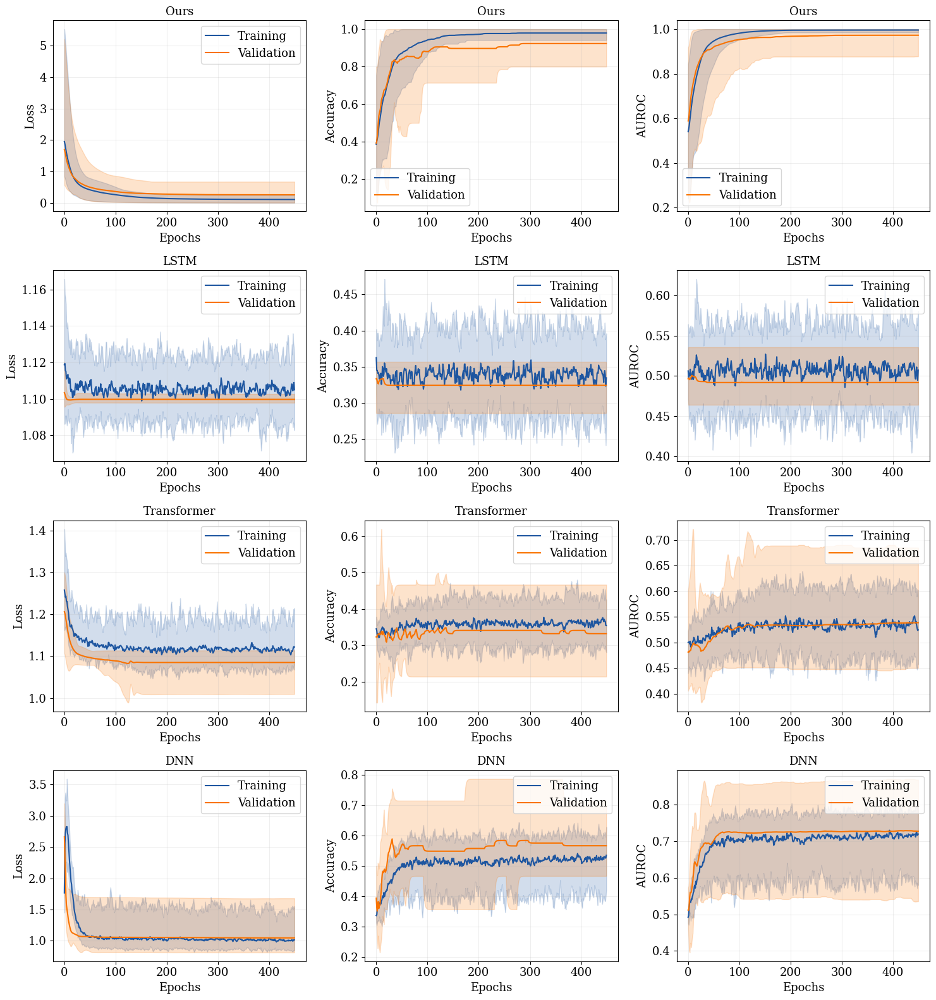

In [ ]:
import numpy as np
import matplotlib.pyplot as plt


plt.rcParams.update({
    'font.family': 'serif',  # Options: 'sans-serif', 'serif', 'monospace', etc.
    'font.size': 13, })


def smooth_curve(points, factor=0.6):
    smoothed = []
    for p in points:
        if smoothed:
            smoothed.append(smoothed[-1] * factor + p * (1 - factor))
        else:
            smoothed.append(p)
    return smoothed

def plot_metrics_grid_combined():
    metrics = {
        'Ours': np.load('metrics_all.npy', allow_pickle=True).item(),
        'LSTM': np.load('metrics_all_lstm.npy', allow_pickle=True).item(),
        'Transformer': np.load('metrics_all_transformer.npy', allow_pickle=True).item(),
        'DNN': np.load('metrics_all_ddn.npy', allow_pickle=True).item()
    }

    fig, axs = plt.subplots(4, 3, figsize=(15, 16))
    # fig.suptitle("Train/Validation Curves per Model", fontsize=22)

    model_names = list(metrics.keys())
    # metrics_grouped = [('loss', 'val_loss'), ('accuracy', 'val_accuracy'), ('auc', 'val_auc')]
    metrics_grouped = [
        ('loss', 'val_loss', 'Loss'),
        ('accuracy', 'val_accuracy', 'Accuracy'),
        ('auc', 'val_auc', 'AUROC')
    ]

    for i, model_name in enumerate(model_names):
        data = metrics[model_name]
        for j, (train_metric, val_metric, label) in enumerate(metrics_grouped):
            ax = axs[i, j]
            if train_metric in data and val_metric in data:
                train_vals = np.array(data[train_metric])
                val_vals = np.array(data[val_metric])
                train_mean = smooth_curve(train_vals.mean(axis=0))
                val_mean = smooth_curve(val_vals.mean(axis=0))
                train_min = smooth_curve(train_vals.min(axis=0))
                train_max = smooth_curve(train_vals.max(axis=0))
                val_min = smooth_curve(val_vals.min(axis=0))
                val_max = smooth_curve(val_vals.max(axis=0))
                epochs = range(len(train_mean))

                ax.plot(epochs, train_mean, label='Training', color='#1E56A0')
                ax.fill_between(epochs, train_min, train_max, alpha=0.2, color='#1E56A0')
                ax.plot(epochs, val_mean, label='Validation', color='#F97300')
                ax.fill_between(epochs, val_min, val_max, alpha=0.2, color='#F97300')

                ax.set_title(f"{model_name}", fontsize=13)
                ax.set_xlabel("Epochs")
                ax.set_ylabel(label)
                ax.grid(True, alpha=0.2)
                ax.legend()

    plt.tight_layout()
    plt.show()

# Run this
plot_metrics_grid_combined()


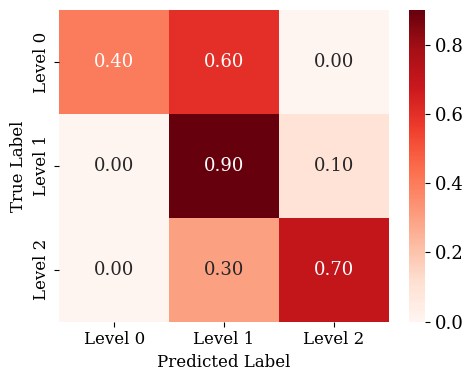

In [ ]:
#dnn

import seaborn as sns
conf_matrix = np.array([[4, 6, 0],
       [0, 9, 1],
       [0, 3, 7]])

class_labels = ['Level 0', 'Level 1', 'Level 2']

conf_matrix = conf_matrix.astype('float') / conf_matrix.sum(axis=1, keepdims=True)

plt.figure(figsize=(5 ,4))
sns.heatmap(conf_matrix, annot=True, fmt='.2f', cmap='Reds', xticklabels=class_labels, yticklabels=class_labels)

# Add labels and title
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
# plt.title('Confusion Matrix', fontsize=13)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()  # Adjusted h_pad to increase row spacing

# Save and show plot
plt.savefig('confusion_matrix_test_dnn.png', dpi=600, bbox_inches='tight')
plt.show()

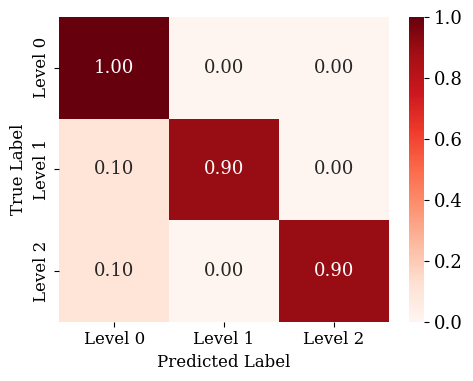

In [ ]:
#ours
conf_matrix = np.array([[10, 0, 0],
                        [1, 9, 0],
                        [1, 0, 9]])

class_labels = ['Level 0', 'Level 1', 'Level 2']

conf_matrix = conf_matrix.astype('float') / conf_matrix.sum(axis=1, keepdims=True)

plt.figure(figsize=(5 ,4))
sns.heatmap(conf_matrix, annot=True, fmt='.2f', cmap='Reds', xticklabels=class_labels, yticklabels=class_labels)

# Add labels and title
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
# plt.title('Confusion Matrix', fontsize=13)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()  # Adjusted h_pad to increase row spacing

# Save and show plot
plt.savefig('confusion_matrix_test_ourmodel.png', dpi=600, bbox_inches='tight')
plt.show()

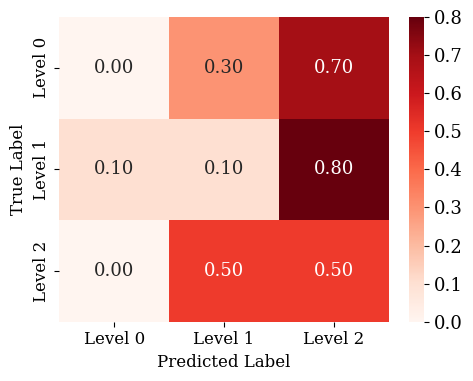

In [ ]:
#trasformer

 conf_matrix = np.array([[0, 3 ,7],
 [1, 1, 8],
 [0, 5, 5]])

class_labels = ['Level 0', 'Level 1', 'Level 2']

conf_matrix = conf_matrix.astype('float') / conf_matrix.sum(axis=1, keepdims=True)

plt.figure(figsize=(5 ,4))
sns.heatmap(conf_matrix, annot=True, fmt='.2f', cmap='Reds', xticklabels=class_labels, yticklabels=class_labels)

# Add labels and title
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
# plt.title('Confusion Matrix', fontsize=13)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()  # Adjusted h_pad to increase row spacing

# Save and show plot
plt.savefig('confusion_matrix_test_ourmodel.png', dpi=600, bbox_inches='tight')
plt.show()

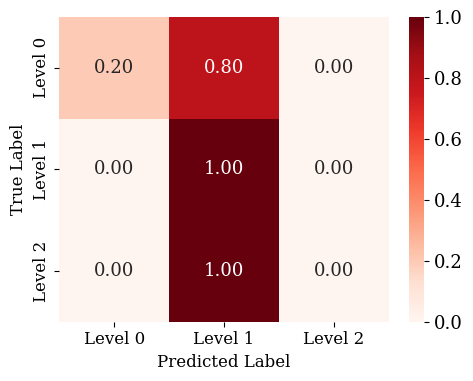

In [ ]:


## lstm
 conf_matrix = np.array([[ 2,  8,  0],
 [ 0,10,  0],
 [ 0, 10,  0]])

class_labels = ['Level 0', 'Level 1', 'Level 2']

conf_matrix = conf_matrix.astype('float') / conf_matrix.sum(axis=1, keepdims=True)

plt.figure(figsize=(5 ,4))
sns.heatmap(conf_matrix, annot=True, fmt='.2f', cmap='Reds', xticklabels=class_labels, yticklabels=class_labels)

# Add labels and title
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
# plt.title('Confusion Matrix', fontsize=13)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()  # Adjusted h_pad to increase row spacing

# Save and show plot
# plt.savefig('confusion_matrix_test_ourmodel.png', dpi=600, bbox_inches='tight')
plt.show()
 

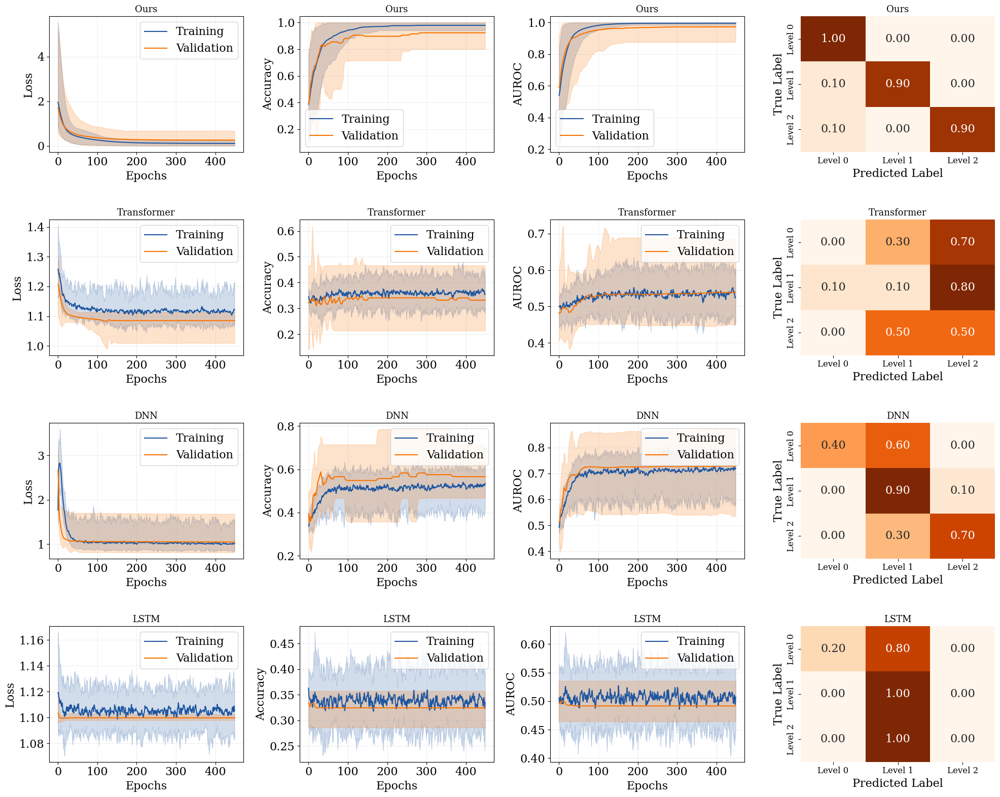

In [96]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

plt.rcParams.update({
    'font.family': 'serif',
    'font.size': 16,
})

def smooth_curve(points, factor=0.6):
    smoothed = []
    for p in points:
        if smoothed:
            smoothed.append(smoothed[-1] * factor + p * (1 - factor))
        else:
            smoothed.append(p)
    return smoothed

def plot_metrics_grid_combined():
    metrics = {
        'Ours': np.load('metrics_all.npy', allow_pickle=True).item(),
        'Transformer': np.load('metrics_all_transformer.npy', allow_pickle=True).item(),
        'DNN': np.load('metrics_all_ddn.npy', allow_pickle=True).item(),
        'LSTM': np.load('metrics_all_lstm.npy', allow_pickle=True).item(),
    }

    conf_matrices = {
        'Ours': np.array([[10, 0, 0],
                          [1, 9, 0],
                          [1, 0, 9]]),
        'LSTM': np.array([[2, 8, 0],
                          [0,10, 0],
                          [0,10, 0]]),
        'Transformer': np.array([[0, 3, 7],
                                 [1, 1, 8],
                                 [0, 5, 5]]),
        'DNN': np.array([[4, 6, 0],
                         [0, 9, 1],
                         [0, 3, 7]])
    }

    class_labels = ['Level 0', 'Level 1', 'Level 2']
    fig, axs = plt.subplots(4, 4, figsize=(20, 16))  # 4x4 grid now

    model_names = list(metrics.keys())
    metrics_grouped = [
        ('loss', 'val_loss', 'Loss'),
        ('accuracy', 'val_accuracy', 'Accuracy'),
        ('auc', 'val_auc', 'AUROC')
    ]

    for i, model_name in enumerate(model_names):
        data = metrics[model_name]
        for j, (train_metric, val_metric, label) in enumerate(metrics_grouped):
            ax = axs[i, j]
            if train_metric in data and val_metric in data:
                train_vals = np.array(data[train_metric])
                val_vals = np.array(data[val_metric])
                train_mean = smooth_curve(train_vals.mean(axis=0))
                val_mean = smooth_curve(val_vals.mean(axis=0))
                train_min = smooth_curve(train_vals.min(axis=0))
                train_max = smooth_curve(train_vals.max(axis=0))
                val_min = smooth_curve(val_vals.min(axis=0))
                val_max = smooth_curve(val_vals.max(axis=0))
                epochs = range(len(train_mean))

                ax.plot(epochs, train_mean, label='Training', color='#1E56A0')
                ax.fill_between(epochs, train_min, train_max, alpha=0.2, color='#1E56A0')
                ax.plot(epochs, val_mean, label='Validation', color='#F97300')
                ax.fill_between(epochs, val_min, val_max, alpha=0.2, color='#F97300')

                ax.set_title(f"{model_name}", fontsize=13)
                ax.set_xlabel("Epochs")
                ax.set_ylabel(label)
                ax.grid(True, alpha=0.2)
                ax.legend()

        # Confusion matrix in the 4th column
        cm = conf_matrices[model_name].astype('float')
        cm /= cm.sum(axis=1, keepdims=True)
        sns.heatmap(cm, annot=True, fmt='.2f', cmap='Oranges', 
                    xticklabels=class_labels, yticklabels=class_labels, 
                    cbar=False, ax=axs[i, 3])
        axs[i, 3].set_xlabel('Predicted Label')
        axs[i, 3].set_ylabel('True Label')
        axs[i, 3].set_title(f'{model_name}', fontsize=13)
        axs[i, 3].tick_params(labelsize=12)

    plt.tight_layout()
    plt.savefig('combined_metrics_allmodels.png', dpi=400)
    plt.subplots_adjust(hspace=0.5)  # Increase spacing between rows
    
    plt.show()

# Run this
plot_metrics_grid_combined()


# KNN

In [122]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import numpy as np
import time

num_classes = Y_labels.shape[1]

metrics_knn = {
    'accuracy': None,
    'precision': None,
    'recall': None,
    'f1': None,
    'confusion_matrix': None
}
metrics_per_class_knn = {
    f'{metric}_class_{i}': None for i in range(num_classes)
    for metric in ['precision', 'recall', 'f1', 'acc']
}

start_time = time.time()
initial_ram = get_memory_usage()

# Flatten the input
X_train_flat = X_train_raweeg.reshape(X_train_raweeg.shape[0], -1)

# Convert one-hot to class labels
y_train = np.argmax(Y_train, axis=1)


model = KNeighborsClassifier(n_neighbors=10)
model.fit(X_train_flat, y_train)


# Overall metrics
metrics_knn['accuracy'] = accuracy_score(y_test, y_pred)
metrics_knn['precision'] = precision_score(y_test, y_pred, average='macro', zero_division=0)
metrics_knn['recall'] = recall_score(y_test, y_pred, average='macro', zero_division=0)
metrics_knn['f1'] = f1_score(y_test, y_pred, average='macro', zero_division=0)
metrics_knn['confusion_matrix'] = confusion_matrix(y_test, y_pred)

# Per-class metrics
for i in range(num_classes):
    mask = (y_test == i)
    metrics_per_class_knn[f'acc_class_{i}'] = accuracy_score(y_test[mask], y_pred[mask]) if mask.any() else 0
    metrics_per_class_knn[f'precision_class_{i}'] = precision_score(y_test, y_pred, labels=[i], average='macro', zero_division=0)
    metrics_per_class_knn[f'recall_class_{i}'] = recall_score(y_test, y_pred, labels=[i], average='macro', zero_division=0)
    metrics_per_class_knn[f'f1_class_{i}'] = f1_score(y_test, y_pred, labels=[i], average='macro', zero_division=0)

final_ram_usage = get_memory_usage() - initial_ram
total_time = time.time() - start_time

print("RAM usage:", final_ram_usage)
print("Total time:", total_time)


RAM usage: 19.1875
Total time: 0.025468111038208008


In [123]:
# Flatten test input
X_test_flat = X_test_raweeg.reshape(X_test_raweeg.shape[0], -1)
y_test = np.argmax(Y_test, axis=1)

# Predict on test set
y_pred_test = model.predict(X_test_flat)

# Compute test metrics
test_accuracy = accuracy_score(y_test, y_pred_test)
test_precision = precision_score(y_test, y_pred_test, average='macro', zero_division=0)
test_recall = recall_score(y_test, y_pred_test, average='macro', zero_division=0)
test_f1 = f1_score(y_test, y_pred_test, average='macro', zero_division=0)
test_cm = confusion_matrix(y_test, y_pred_test)

print("\n--- Test Set Evaluation ---")
print("Test Accuracy:", test_accuracy)
print("Test Precision (macro):", test_precision)
print("Test Recall (macro):", test_recall)
print("Test F1 Score (macro):", test_f1)
print("Test Confusion Matrix:\n", test_cm)



--- Test Set Evaluation ---
Test Accuracy: 0.5
Test Precision (macro): 0.5779645191409898
Test Recall (macro): 0.5
Test F1 Score (macro): 0.5108932461873638
Test Confusion Matrix:
 [[4 6 0]
 [2 6 2]
 [0 5 5]]


# SVM

In [106]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import numpy as np
import time

num_classes = Y_labels.shape[1]

metrics_svm = {
    'accuracy': None,
    'precision': None,
    'recall': None,
    'f1': None,
    'confusion_matrix': None
}
metrics_per_class_svm = {
    f'{metric}_class_{i}': None for i in range(num_classes)
    for metric in ['precision', 'recall', 'f1', 'acc']
}

start_time = time.time()
initial_ram = get_memory_usage()

# Flatten inputs
X_train_flat = X_train_raweeg.reshape(X_train_raweeg.shape[0], -1)
X_test_flat = X_test_raweeg.reshape(X_test_raweeg.shape[0], -1)
y_train = np.argmax(Y_train, axis=1)
y_test = np.argmax(Y_test, axis=1)

# Train SVM
model = SVC(kernel='rbf', probability=True)
model.fit(X_train_flat, y_train)

# Predict on test set
y_pred_test = model.predict(X_test_flat)

# Overall metrics
metrics_svm['accuracy'] = accuracy_score(y_test, y_pred_test)
metrics_svm['precision'] = precision_score(y_test, y_pred_test, average='macro', zero_division=0)
metrics_svm['recall'] = recall_score(y_test, y_pred_test, average='macro', zero_division=0)
metrics_svm['f1'] = f1_score(y_test, y_pred_test, average='macro', zero_division=0)
metrics_svm['confusion_matrix'] = confusion_matrix(y_test, y_pred_test)

# Per-class metrics
for i in range(num_classes):
    mask = (y_test == i)
    metrics_per_class_svm[f'acc_class_{i}'] = accuracy_score(y_test[mask], y_pred_test[mask]) if mask.any() else 0
    metrics_per_class_svm[f'precision_class_{i}'] = precision_score(y_test, y_pred_test, labels=[i], average='macro', zero_division=0)
    metrics_per_class_svm[f'recall_class_{i}'] = recall_score(y_test, y_pred_test, labels=[i], average='macro', zero_division=0)
    metrics_per_class_svm[f'f1_class_{i}'] = f1_score(y_test, y_pred_test, labels=[i], average='macro', zero_division=0)

final_ram_usage = get_memory_usage() - initial_ram
total_time = time.time() - start_time

print("\n--- Test Set Evaluation ---")
print("Test Accuracy:", metrics_svm['accuracy'])
print("Test Precision (macro):", metrics_svm['precision'])
print("Test Recall (macro):", metrics_svm['recall'])
print("Test F1 Score (macro):", metrics_svm['f1'])
print("Test Confusion Matrix:\n", metrics_svm['confusion_matrix'])
print("RAM usage:", final_ram_usage)
print("Total time:", total_time)



--- Test Set Evaluation ---
Test Accuracy: 0.6666666666666666
Test Precision (macro): 0.6922799422799423
Test Recall (macro): 0.6666666666666666
Test F1 Score (macro): 0.6696375519904931
Test Confusion Matrix:
 [[7 3 0]
 [2 7 1]
 [2 2 6]]
RAM usage: 27.03125
Total time: 0.4634881019592285


# Radar Plot

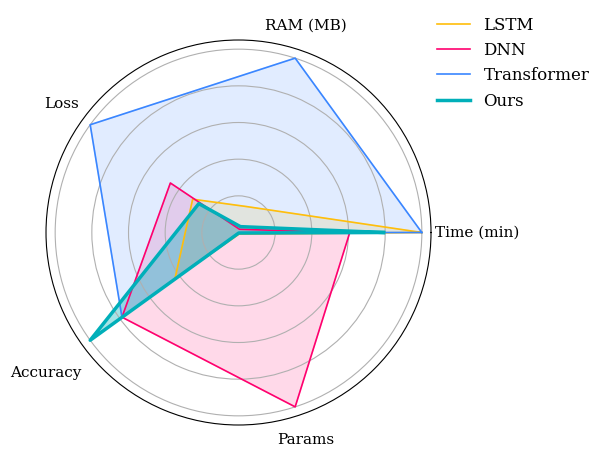

In [216]:
import matplotlib.pyplot as plt
import numpy as np



plt.rcParams.update({
    'font.family': 'serif',
    'font.size': 13,
})

# Labels to include
labels = ["Time (min)", "RAM (MB)", "Loss", "Accuracy", "Params"]
angles = np.linspace(0, 2 * np.pi, len(labels), endpoint=False).tolist()
angles += angles[:1]

# Models and selected metrics: [RAM, Time, Loss, Accuracy, Params]
models = ["LSTM", "DNN", "Transformer", "Ours"]
data = {
    "LSTM": [455, 2992 / 60, 1.0525, 40.00, 17859],
    "DNN": [276.1875, 371.7001850605011 / 60, 1.5645, 73.33, 1940099],
    "Transformer": [454.9375, 20148.65910434723 / 60, 3.4054, 73.33, 1251],
    "Ours": [359.859375, 678.3397097587585 / 60, 0.912, 93.33, 6240],
}

normalized_data = {}
for key in models:
    values = np.array(data[key])
    max_vals = np.nanmax([[data[m][i] for m in models] for i in range(len(labels))], axis=1)
    normalized = values / max_vals
    normalized_data[key] = normalized

fig, ax = plt.subplots(figsize=(5, 5), subplot_kw=dict(polar=True))
colors = ['#ffbe0b', '#ff006e', '#3a86ff', '#00afb9']  

for model, color in zip(models, colors):
    values = normalized_data[model].tolist()
    values += values[:1]
    linewidth = 2.5 if model == "Ours" else 1.2
    alpha_fill = 0.35 if model == "Ours" else 0.15
    ax.plot(angles, values, label=model, color=color, linewidth=linewidth)
    ax.fill(angles, values, color=color, alpha=alpha_fill)

ax.set_xticks([])

for angle, label in zip(angles[:-1], labels):
    if label == "Time (min)" or label == "Accuracy":
        ax.text(angle, 1.3, label, fontsize=11, ha='center', va='center') 
    else:
        ax.text(angle, 1.19, label, fontsize=11, ha='center', va='center')

ax.set_yticklabels([])
ax.legend(loc='upper right', bbox_to_anchor=(1.45, 1.1),fontsize=12, frameon=False)
plt.savefig('radar_plot.png', dpi=600, bbox_inches='tight')
# plt.tight_layout()
plt.show()
